In [10]:
import os
import torch
import matplotlib.pyplot as plt

/tmp/ipykernel_655100/2189462240.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  initial_stats = torch.load(os.path.join(base_dir, step_files[0]), map_location="cpu")
/

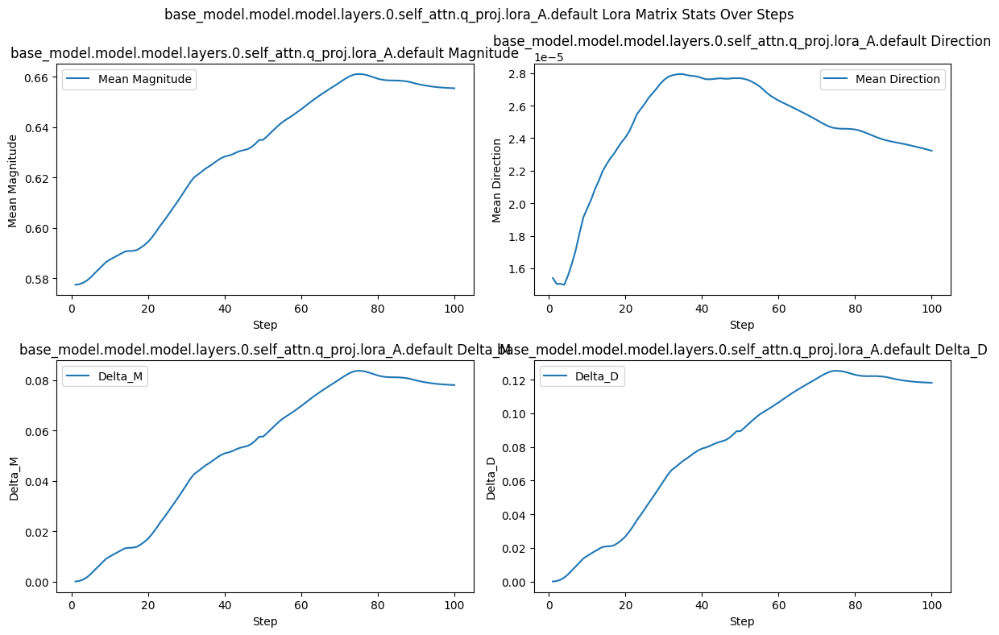

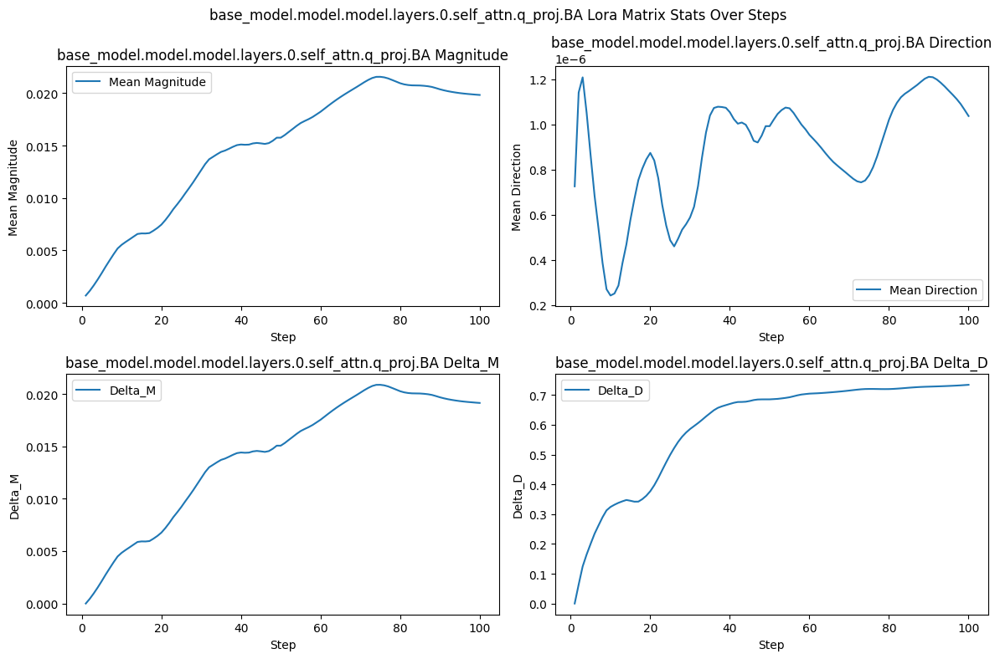

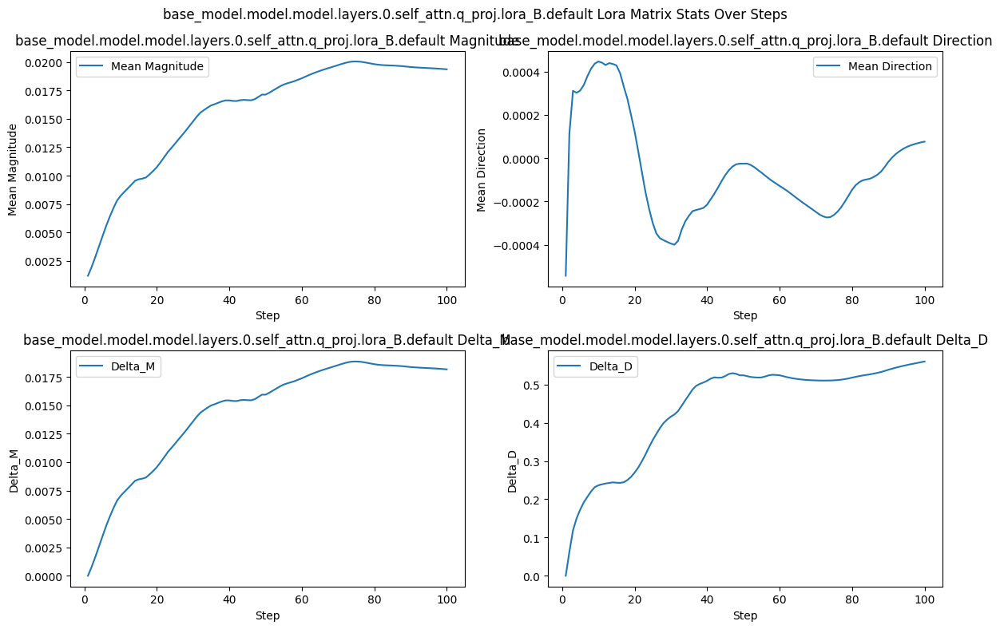

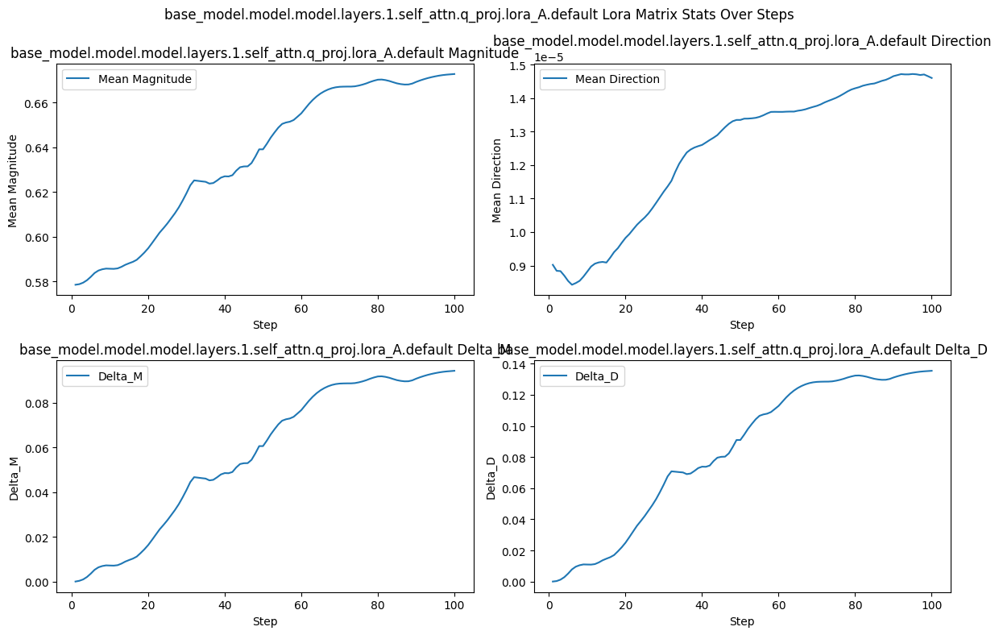

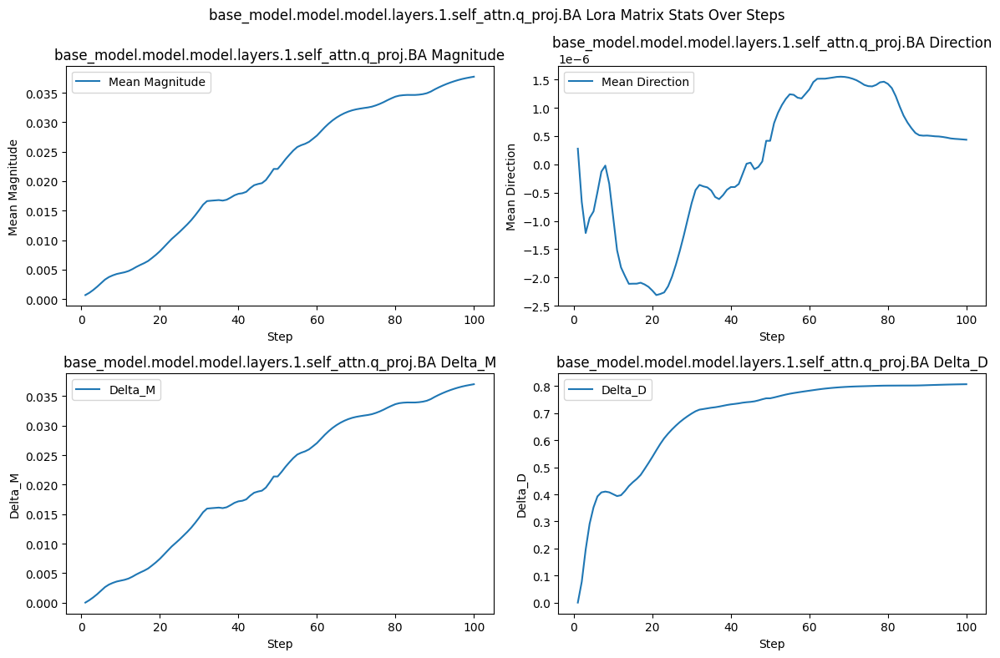

...

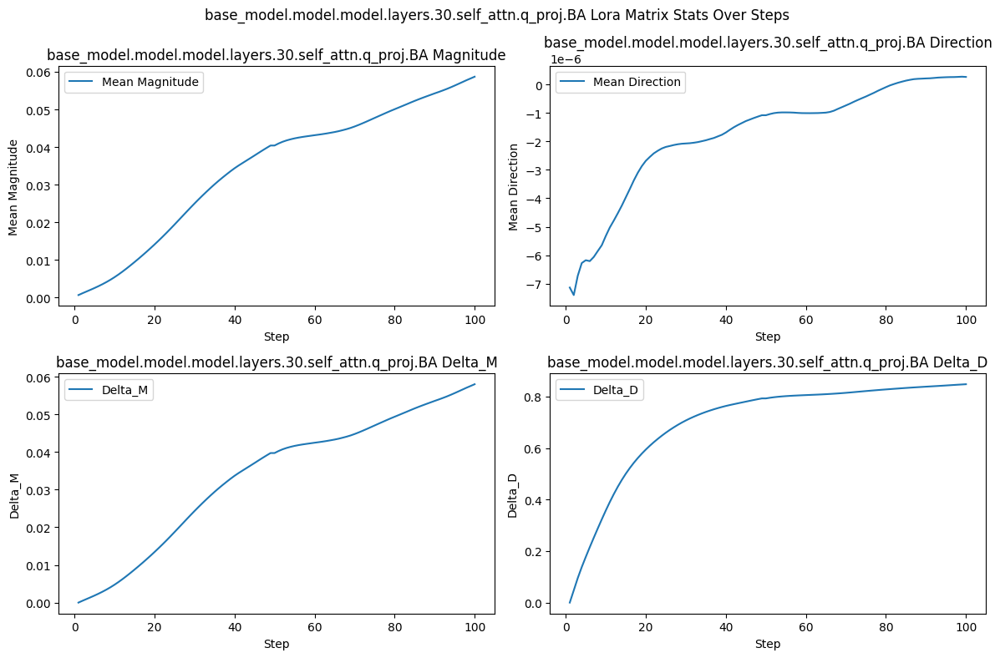

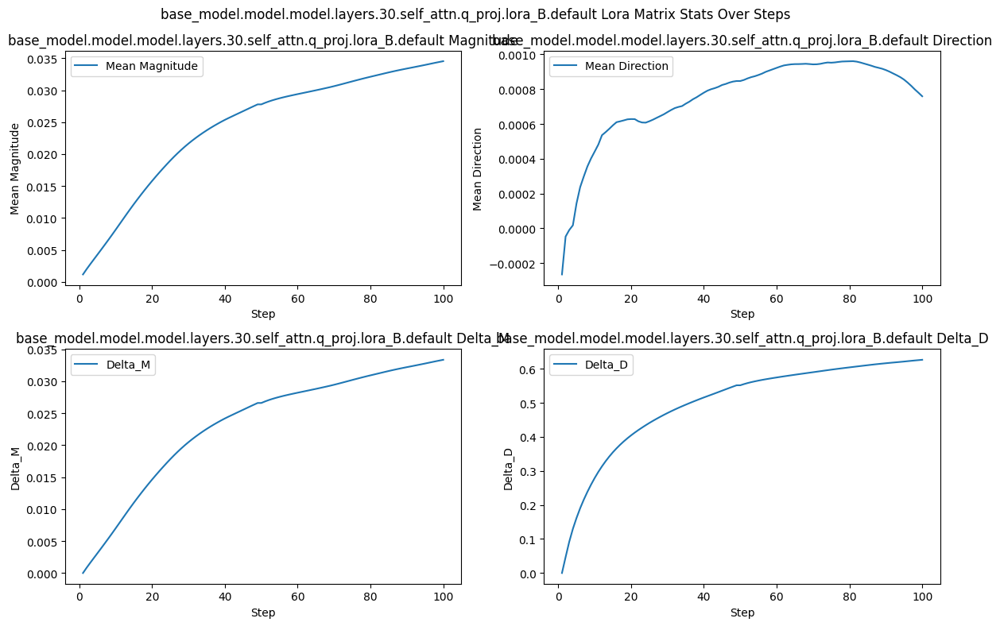

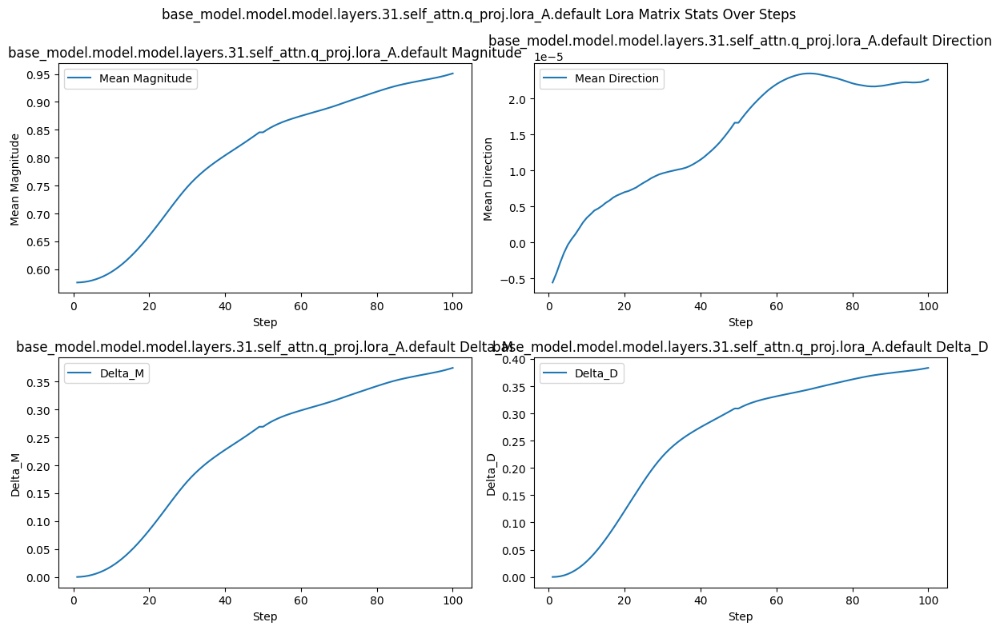

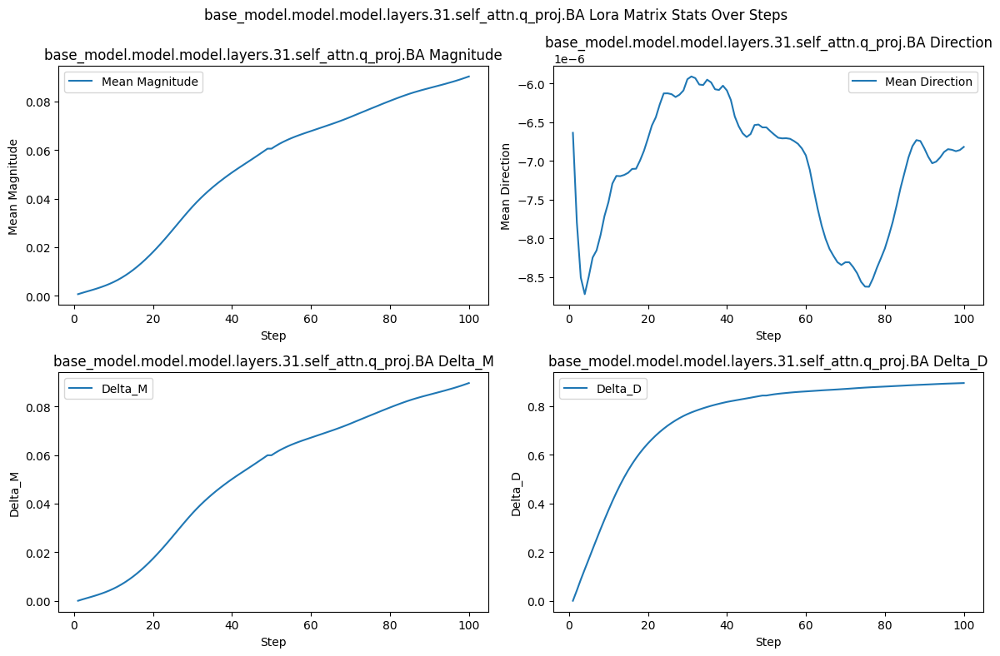

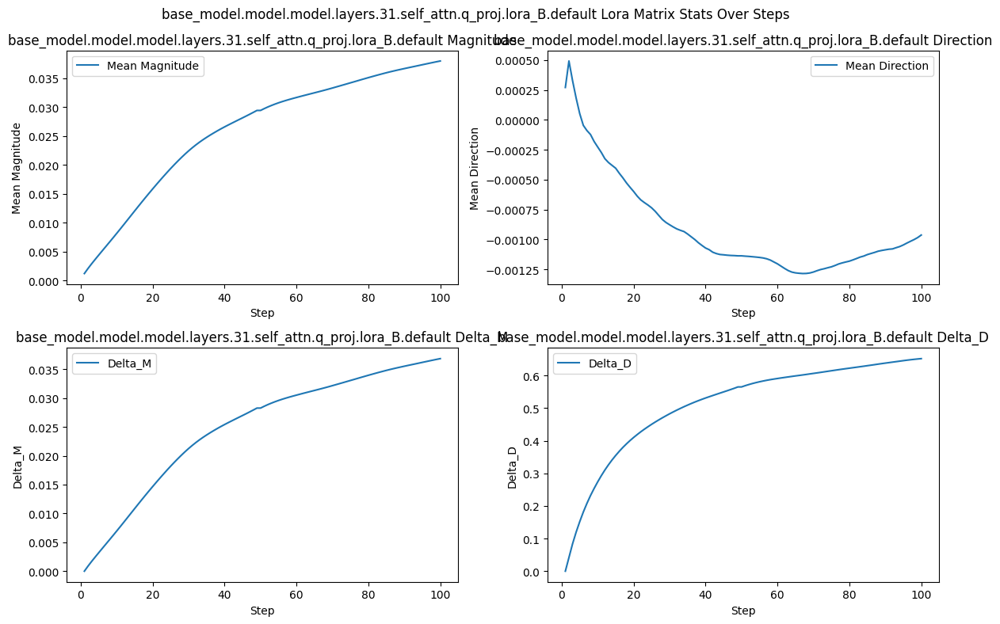

In [15]:
import os
import torch
import matplotlib.pyplot as plt

base_dir = "lora-shepherd-7b_1/1/trainer_saved/local_output_0/weight_stats"
steps = sorted([int(f.split('_')[1]) for f in os.listdir(base_dir) if f.startswith("step_") and f.endswith(".pt")])[:100]
step_files = [f"step_{step}_weight_stats.pt" for step in steps]

# 加载初始权重
initial_stats = torch.load(os.path.join(base_dir, step_files[0]), map_location="cpu")

layers = [name for name in initial_stats.keys() if "lora_A" in name or "lora_B" in name]

# 统计每层每step的magnitude/direction/delta_M/delta_D
stats = {layer: {"magnitude": [], "direction": [], "delta_M": [], "delta_D": []} for layer in layers}

for step_file in step_files:
    data = torch.load(os.path.join(base_dir, step_file), map_location="cpu")
    for layer in layers:
        mag = data[layer]["magnitude"].float().squeeze()
        dir = data[layer]["direction"].float()
        stats[layer]["magnitude"].append(mag.mean().item())
        stats[layer]["direction"].append(dir.mean().item())

        # delta_M
        mag0 = initial_stats[layer]["magnitude"].float().squeeze()
        k = mag.shape[0]
        delta_M = torch.abs(mag - mag0).sum() / k
        stats[layer]["delta_M"].append(delta_M.item())

        # delta_D
        dir0 = initial_stats[layer]["direction"].float()
        cos_sim = torch.sum(dir * dir0, dim=1)
        cos_sim = torch.clamp(cos_sim, -1.0, 1.0)
        delta_D = (1 - cos_sim).sum() / k
        stats[layer]["delta_D"].append(delta_D.item())

    for prefix in set([l.split("lora_A.default")[0] for l in layers if "lora_A.default" in l]):
        name_A = prefix + "lora_A.default"
        name_B = prefix + "lora_B.default"
        if name_A in data and name_B in data:
            # 当前step
            A_mat = data[name_A]["magnitude"].float()*data[name_A]["direction"].float()
            B_mat = data[name_B]["magnitude"].float()*data[name_B]["direction"].float()
            BA = torch.matmul(B_mat, A_mat)
            BA_mag = torch.linalg.norm(BA, dim=1, keepdim=True)
            BA_dir = BA / BA_mag

            # 初始step
            A0_mat = initial_stats[name_A]["magnitude"].float()*initial_stats[name_A]["direction"].float()
            B0_mat = initial_stats[name_B]["magnitude"].float()*initial_stats[name_B]["direction"].float()
            BA0 = torch.matmul(B0_mat, A0_mat)
            BA0_mag = torch.linalg.norm(BA0, dim=1, keepdim=True)
            BA0_dir = BA0 / BA0_mag

            k_ba = BA_mag.shape[0]
            delta_M_ba = torch.abs(BA_mag - BA0_mag).sum() / k_ba
            cos_sim_ba = torch.sum(BA_dir * BA0_dir, dim=1)
            cos_sim_ba = torch.clamp(cos_sim_ba, -1.0, 1.0)
            delta_D_ba = (1 - cos_sim_ba).sum() / k_ba

            key = prefix + "BA"
            if key not in stats:
                stats[key] = {"magnitude": [], "direction": [], "delta_M": [], "delta_D": []}
            stats[key]["magnitude"].append(BA_mag.mean().item())
            stats[key]["direction"].append(BA_dir.mean().item())
            stats[key]["delta_M"].append(delta_M_ba.item())
            stats[key]["delta_D"].append(delta_D_ba.item())

# new_layers = [name for name in stats.keys() if "lora_A" in name or "lora_B" in name or "BA" in name]
new_layers = []
for layer in layers:
    new_layers.append(layer)
    prefix = layer.split("lora_A.default")[0]
    ba_key = prefix + "BA"
    if ba_key in stats:
        new_layers.append(ba_key)

# 绘图
for layer in new_layers:
    plt.figure(figsize=(12, 8))
    plt.subplot(2,2,1)
    plt.plot(steps, stats[layer]["magnitude"], label="Mean Magnitude")
    plt.title(f"{layer} Magnitude")
    plt.xlabel("Step")
    plt.ylabel("Mean Magnitude")
    plt.legend()

    plt.subplot(2,2,2)
    plt.plot(steps, stats[layer]["direction"], label="Mean Direction")
    plt.title(f"{layer} Direction")
    plt.xlabel("Step")
    plt.ylabel("Mean Direction")
    plt.legend()

    plt.subplot(2,2,3)
    plt.plot(steps, stats[layer]["delta_M"], label="Delta_M")
    plt.title(f"{layer} Delta_M")
    plt.xlabel("Step")
    plt.ylabel("Delta_M")
    plt.legend()

    plt.subplot(2,2,4)
    plt.plot(steps, stats[layer]["delta_D"], label="Delta_D")
    plt.title(f"{layer} Delta_D")
    plt.xlabel("Step")
    plt.ylabel("Delta_D")
    plt.legend()

    plt.suptitle(f"{layer} Lora Matrix Stats Over Steps")
    plt.tight_layout()
    plt.show()

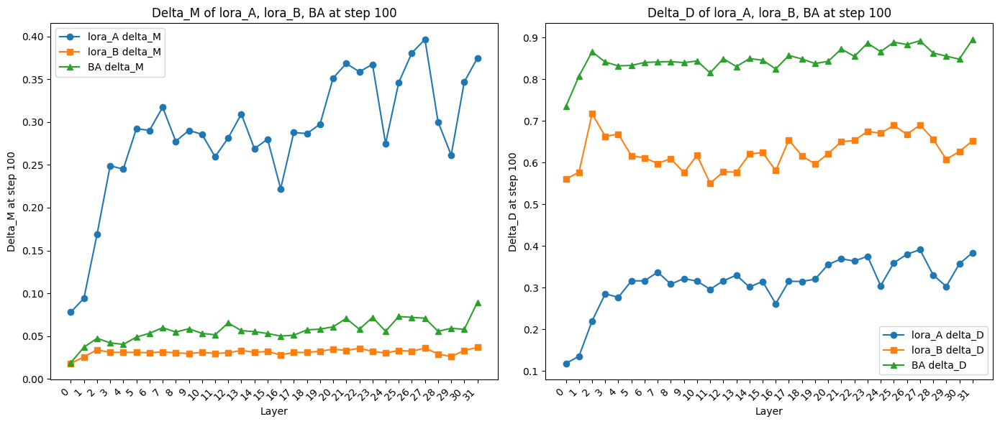

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# 只取最后一个step（如step100），假设step_files[-1]就是step100
step_idx = -1  # step100
layer_names = []
delta_M_A, delta_M_B, delta_M_BA = [], [], []
delta_D_A, delta_D_B, delta_D_BA = [], [], []

for layer in layers:
    prefix = layer.split("lora_A.default")[0]
    name_A = prefix + "lora_A.default"
    name_B = prefix + "lora_B.default"
    ba_key = prefix + "BA"
    # 只统计有BA的层
    if name_A in stats and name_B in stats and ba_key in stats:
        layer_names.append(prefix.rstrip('.'))
        delta_M_A.append(stats[name_A]["delta_M"][step_idx])
        delta_M_B.append(stats[name_B]["delta_M"][step_idx])
        delta_M_BA.append(stats[ba_key]["delta_M"][step_idx])
        delta_D_A.append(stats[name_A]["delta_D"][step_idx])
        delta_D_B.append(stats[name_B]["delta_D"][step_idx])
        delta_D_BA.append(stats[ba_key]["delta_D"][step_idx])

x = np.arange(len(layer_names))
plt.figure(figsize=(14, 6))

plt.subplot(1,2,1)
plt.plot(x, delta_M_A, 'o-', label='lora_A delta_M')
plt.plot(x, delta_M_B, 's-', label='lora_B delta_M')
plt.plot(x, delta_M_BA, '^-', label='BA delta_M')
plt.xticks(x, np.arange(len(layer_names)), rotation=45, ha='right')
plt.xlabel('Layer')
plt.ylabel('Delta_M at step 100')
plt.title('Delta_M of lora_A, lora_B, BA at step 100')
plt.legend()

plt.subplot(1,2,2)
plt.plot(x, delta_D_A, 'o-', label='lora_A delta_D')
plt.plot(x, delta_D_B, 's-', label='lora_B delta_D')
plt.plot(x, delta_D_BA, '^-', label='BA delta_D')
plt.xticks(x, np.arange(len(layer_names)), rotation=45, ha='right')
plt.xlabel('Layer')
plt.ylabel('Delta_D at step 100')
plt.title('Delta_D of lora_A, lora_B, BA at step 100')
plt.legend()

plt.tight_layout()
plt.show()